In [304]:
#importing the required library for lime 
import lime
import lime.lime_tabular
# Initial imports
import numpy as np
import torch
import torch.nn as nn
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
import pandas as pd
from sklearn.model_selection import train_test_split

Importamos los datos

In [305]:
# Read dataset from csv file.
titanic_data = pd.read_csv('../Main Notebook/titanic_data.csv')
titanic_data.head()

,Survived,Age,SibSp,Parch,Fare,female,male,Embark_C,Embark_Q,Embark_S,Class_1,Class_2,Class_3
0,0,22.0,1,0,7.2500,0,1,0,0,1,0,0,1
1,1,38.0,1,0,71.2833,1,0,1,0,0,1,0,0
2,1,26.0,0,0,7.9250,1,0,0,0,1,0,0,1
3,1,35.0,1,0,53.1000,1,0,0,0,1,1,0,0
4,0,35.0,0,0,8.0500,0,1,0,0,1,0,0,1


Dividimos el conjunto en otros dos de entrenamiento y prueba

In [306]:
# División en características (X) y etiquetas (y)
X = titanic_data.drop('Survived', axis=1)
y = titanic_data['Survived']

# División en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Imprime la forma de los conjuntos de entrenamiento y prueba
print("Forma del conjunto de entrenamiento:", X_train.shape)
print("Forma del conjunto de prueba:", X_test.shape)

Forma del conjunto de entrenamiento: (712, 12)
Forma del conjunto de prueba: (179, 12)


In [307]:
X_train.head()

,Age,SibSp,Parch,Fare,female,male,Embark_C,Embark_Q,Embark_S,Class_1,Class_2,Class_3
331,45.5,0,0,28.5000,0,1,0,0,1,1,0,0
733,23.0,0,0,13.0000,0,1,0,0,1,0,1,0
382,32.0,0,0,7.9250,0,1,0,0,1,0,0,1
704,26.0,1,0,7.8542,0,1,0,0,1,0,0,1
813,6.0,4,2,31.2750,1,0,0,0,1,0,0,1


In [308]:
feature_names = X_train.columns
feature_names = feature_names.to_list()

In [309]:
categorical_features = [4, 5, 6, 7, 8, 9, 10, 11]
categorical_names = feature_names[4: ]
categorical_names

['female',
 'male',
 'Embark_C',
 'Embark_Q',
 'Embark_S',
 'Class_1',
 'Class_2',
 'Class_3']

In [310]:
# División en características (X) y etiquetas (y)
#X_train = titanic_data.drop('Survived', axis=1).values
# y_train = titanic_data['Survived'].values

# Convierte los datos de entrenamiento en tensores
#X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
# y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

# Verifica las formas de los tensores
#print("Forma de X_train_tensor:", X_train_tensor.shape)
# print("Forma de y_train_tensor:", y_train_tensor.shape)


Preparamos el modelo clasificador

In [311]:
torch.manual_seed(1)  # Set seed for reproducibility.

class TitanicSimpleNNModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(12, 12)
        self.sigmoid1 = nn.Sigmoid()
        self.linear2 = nn.Linear(12, 8)
        self.sigmoid2 = nn.Sigmoid()
        self.linear3 = nn.Linear(8, 2)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        lin1_out = self.linear1(x)
        sigmoid_out1 = self.sigmoid1(lin1_out)
        sigmoid_out2 = self.sigmoid2(self.linear2(sigmoid_out1))
        return self.softmax(self.linear3(sigmoid_out2))
    
    def predict(self, x):
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x).float()
        elif isinstance(x, torch.Tensor):
            x = x.float()
            
        x = x.view(x.size(0), -1)
        output = self.forward(x)
        predicted_probs = torch.softmax(output, dim=1)
        return predicted_probs


    
    def predict_lime(self, x):
        if isinstance(x, np.ndarray):
            x = torch.from_numpy(x).float()
        elif isinstance(x, torch.Tensor):
            x = x.float()

        x = x.view(x.size(0), -1)
        output = self.forward(x)
        predicted_probs = torch.softmax(output, dim=1)
        _, predicted_labels = torch.max(predicted_probs, 1)
        return predicted_probs.detach().numpy()
    
# Declaramos una nueva instancia de clase
new_net = TitanicSimpleNNModel()

In [312]:
# Cargamos el modelo
modelo_guardado = torch.load('../Main Notebook/titanic_fcnn.pt')

# Creamos una instancia de la clase del modelo
new_net = TitanicSimpleNNModel()

# Cargamos los pesos del modelo guardado en la instancia del modelo
new_net.load_state_dict(modelo_guardado)

# Asegurarse de establecer el modo de evaluación para el modelo
new_net.eval()

TitanicSimpleNNModel(
  (linear1): Linear(in_features=12, out_features=12, bias=True)
  (sigmoid1): Sigmoid()
  (linear2): Linear(in_features=12, out_features=8, bias=True)
  (sigmoid2): Sigmoid()
  (linear3): Linear(in_features=8, out_features=2, bias=True)
  (softmax): Softmax(dim=1)
)

In [313]:
# Comprobamos que funciona usando el método predict
single_input = X_train_tensor[0].unsqueeze(0)
predict = new_net.predict_lime(single_input)
print( 'Prediction: ',predict, 'Input size: ', single_input.shape)

Prediction:  [[0.73105633 0.26894373]] Input size:  torch.Size([1, 12])


In [314]:
input = X_train_tensor[:10]
predict = new_net.predict_lime(input)
print( 'Prediction: ',predict, 'Input size: ', input.shape)

Prediction:  [[0.73105633 0.26894373]
 [0.26910424 0.7308958 ]
 [0.52732056 0.47267947]
 [0.269102   0.730898  ]
 [0.7310557  0.26894435]
 [0.7310548  0.26894525]
 [0.5624097  0.4375904 ]
 [0.7310539  0.26894605]
 [0.693822   0.306178  ]
 [0.26898327 0.7310167 ]] Input size:  torch.Size([10, 12])



* Configurando "explainer".  

A diferencia de lime_text.TextExplainer, los explicadores tabulares requieren un conjunto de entrenamiento. La razón de esto es que calculan estadísticas sobre cada característica (columna). Si la característica es numérica, se calcula la media y la desviación estándar, y se discretiza en cuartiles. Si la característica es categórica, se calcula la frecuencia de cada valor.
Estas estadísticas calculadas se utilizan para dos cosas:

1. Para escalar los datos, de modo que pueda calcular distancias significativas cuando los atributos no están en la misma escala.
2. Para muestrear instancias perturbadas, lo cual se hace muestreando de una distribución Normal(0,1), multiplicando por la desviación estándar y sumando de nuevo la media.


1. Discretizador:   
Si discretize_continuous está configurado como verdadero, todas las características no categóricas se discretizarán en 'cuartiles' de forma predeterminada. Puedes establecerlo en 'deciles' o 'entropía'. La discretización se utiliza/prefiere debido a que nuestros valores numéricos pueden estar en diferentes rangos. De esta manera, estandarizamos los datos, pero luego el significado de los coeficientes cambia.

Es difícil pensar en dobles negativas (es decir, un peso negativo para una característica negativa = contribución positiva). Mostraremos tanto el resultado con como sin discretización.

### Caracteristicas en la observacion Global. 

In [315]:
print(type(X_train))

<class 'pandas.core.frame.DataFrame'>


### Importancia de las caracterisiticas en diferentes observaciones locales. 

In [316]:
print(type(X_train))

<class 'pandas.core.frame.DataFrame'>


Mostramos las instancias que se van a estudiar

In [317]:
df=pd.concat([X_train.iloc[2, :],X_train.iloc[5, :], X_train.iloc[150, :], X_train.iloc[30, :]],axis=1, )


df.columns = ['Observacion 1', 'Observacion 2', 'Observacion 3', 'Observacion 4']
df.T
df.head(50)

,Observacion 1,Observacion 2,Observacion 3,Observacion 4
Age,32.000,24.0000,29.699118,50.00
SibSp,0.000,0.0000,0.000000,0.00
Parch,0.000,1.0000,0.000000,0.00
Fare,7.925,247.5208,7.750000,8.05
female,0.000,0.0000,0.000000,0.00
male,1.000,1.0000,1.000000,1.00
Embark_C,0.000,1.0000,0.000000,0.00
Embark_Q,0.000,0.0000,1.000000,0.00
Embark_S,1.000,0.0000,0.000000,1.00
Class_1,0.000,1.0000,0.000000,0.00


Intercept 0.7955164584880532
Prediction_local [0.2097955]
Right: 0.2689443
Intercept 0.5664899236586998
Prediction_local [0.74921719]
Right: 0.73062027
Intercept 0.7603718445972877
Prediction_local [0.20136045]
Right: 0.26894507
Intercept 0.8039571807299934
Prediction_local [0.12140821]
Right: 0.2689444


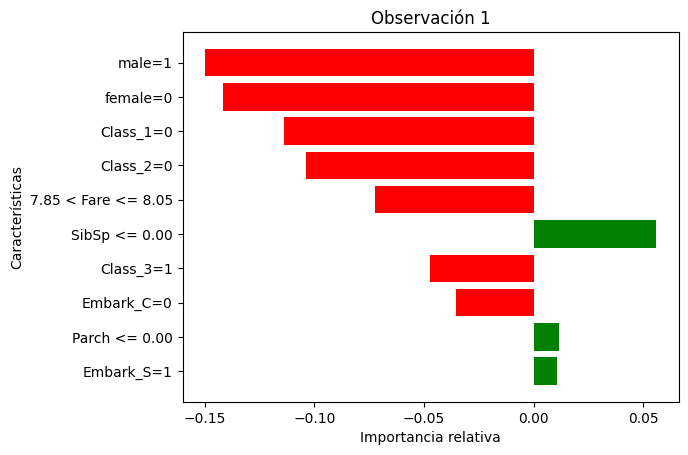

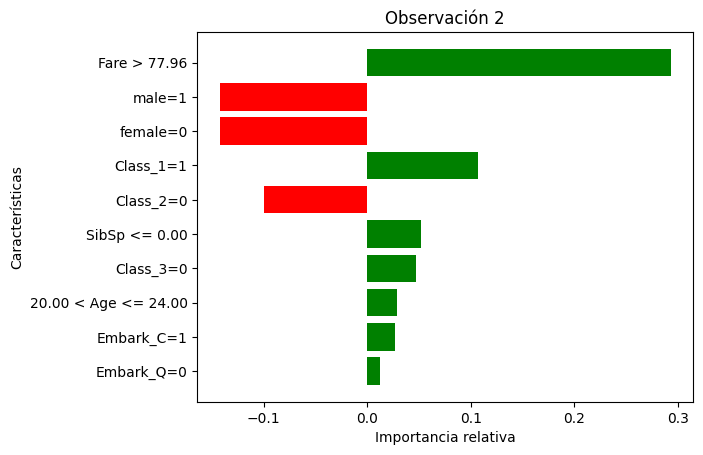

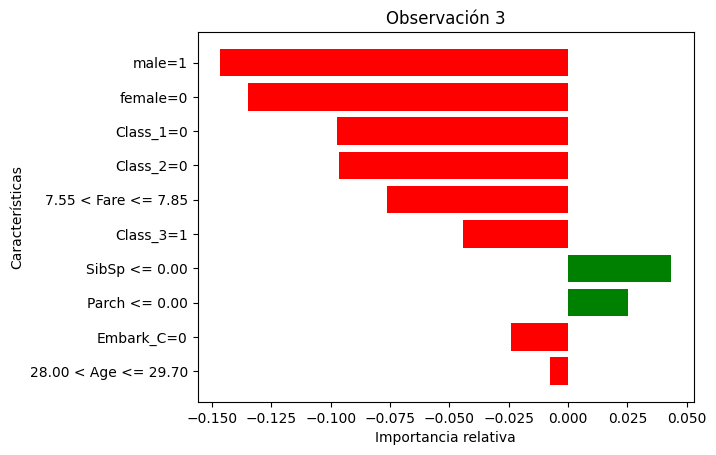

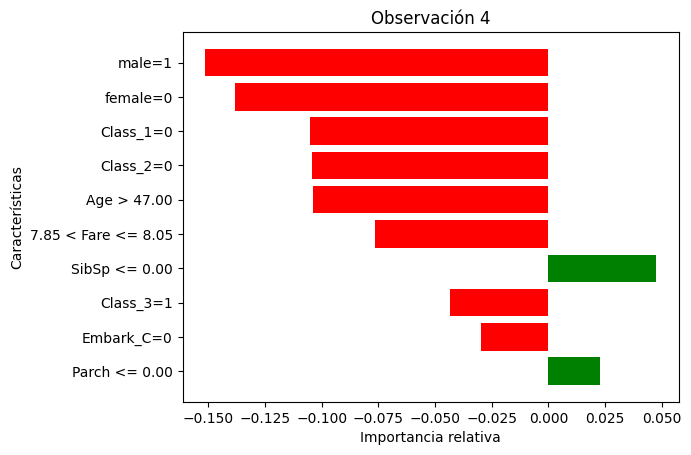

In [318]:

# 3. Comparación de explicaciones
exp_1 = explainer.explain_instance(X_train.iloc[2, :], new_net.predict_lime, num_features=10)
exp_2 = explainer.explain_instance(X_train.iloc[5, :], new_net.predict_lime, num_features=10)
exp_3 = explainer.explain_instance(X_train.iloc[150, :], new_net.predict_lime, num_features=10)
exp_4 = explainer.explain_instance(X_train.iloc[30, :], new_net.predict_lime, num_features=10)
list_exp = [exp_1, exp_2, exp_3, exp_4]
i=1
for prediction in list_exp:
    exp_bar = prediction.as_pyplot_figure(label=exp.available_labels()[0])
    plt.title(f"Observación {i}")
    plt.xlabel("Importancia relativa")
    plt.ylabel("Características")
    plt.show()
    prediction.show_in_notebook(show_table=True)
    i += 1


Intercept 0.790987065638072
Prediction_local [0.21397751]
Right: 0.2689443
Intercept 0.6245137723287197
Prediction_local [0.43963339]
Right: 0.26932707


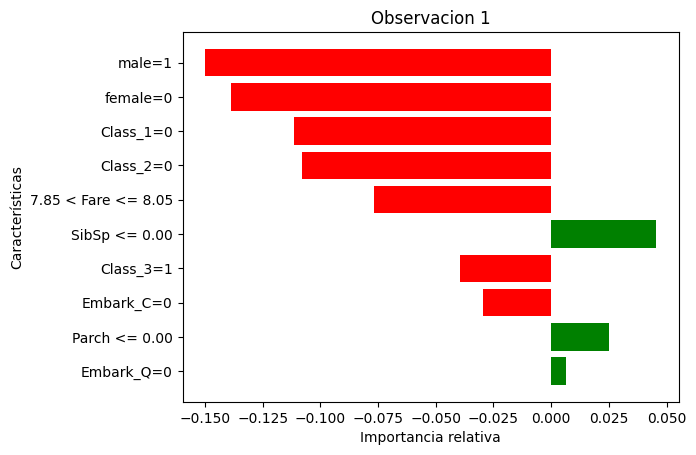

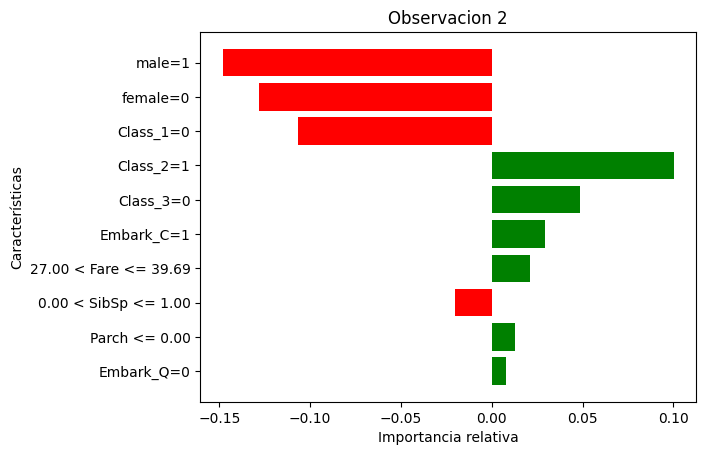

In [319]:

# 6. Análisis de errores
exp_correct = explainer.explain_instance(X_train.iloc[2, :], new_net.predict_lime, num_features=10)
exp_incorrect = explainer.explain_instance(X_train.iloc[7, :], new_net.predict_lime, num_features=10)

exp_bar = exp_correct.as_pyplot_figure(label=exp.available_labels()[0])
plt.title("Observacion 1")
plt.xlabel("Importancia relativa")
plt.ylabel("Características")
plt.show()
exp_correct.show_in_notebook(show_table=True)


exp_bar = exp_incorrect.as_pyplot_figure(label=exp.available_labels()[0])
plt.title("Observacion 2")
plt.xlabel("Importancia relativa")
plt.ylabel("Características")
plt.show()
exp_incorrect.show_in_notebook(show_table=True)



In [320]:

# 7. Visualización de distribuciones condicionales
exp_conditional = explainer.explain_instance(X_train.iloc[2, :], new_net.predict_lime, num_features=10, labels=(1,))
exp_conditional.show_in_notebook(show_table=True)

Intercept 0.8021527177218155
Prediction_local [0.20678152]
Right: 0.2689443
